In [30]:
# for inline image display inside notebook
# % matplotlib inline 
import numpy as np
from PIL import Image, ImageFont, ImageDraw
from PIL.ImageChops import add, subtract, multiply, difference, screen
import PIL.ImageStat as stat
from skimage.io import imread, imsave, imshow, show, imread_collection, imshow_collection
from skimage import color, viewer, exposure, img_as_float, data
from skimage.transform import SimilarityTransform, warp, swirl
from skimage.util import invert, random_noise, montage
import matplotlib.image as mpimg
import matplotlib.pylab as plt
from scipy.ndimage import affine_transform, zoom
from scipy import misc
from PyQt5.QtWidgets import QApplication
import imageio
from skimage.color import rgb2gray

In [2]:
im = Image.open("../images/parrot.png")
print(im.mode)

#  RGB
im.save("../images/parrot.jpg")

RGB


In [3]:
im = Image.open("../images/hill.png")
print(im.mode)
# RGBA
im.convert('RGB').save("../images/hill.jpg") # first convert to RGB mode

RGB


In [5]:
im = imread("../images/parrot.png", as_gray=True)
print(im.shape)
#(362L, 486L)

(340, 453)


/home/teguhteja/P/PythonProject/imgprocpython/env/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: Non RGB image conversion is now deprecated. For RGBA images, please use rgb2gray(rgba2rgb(rgb)) instead. In version 0.19, a ValueError will be raised if input image last dimension length is not 3.
  


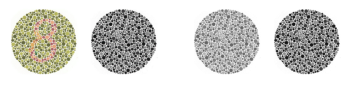

In [7]:
im = imread("../images/Ishihara.png")
im_g = color.rgb2gray(im)
plt.subplot(121), plt.imshow(im, cmap='gray'), plt.axis('off')
plt.subplot(122), plt.imshow(im_g, cmap='gray'), plt.axis('off')
plt.show()

<Figure size 432x288 with 0 Axes>

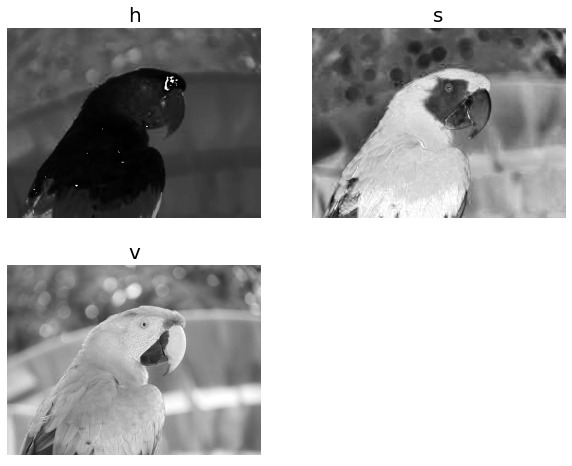

In [8]:
im = imread("../images/parrot.png")
im_hsv = color.rgb2hsv(im)
plt.gray()
plt.figure(figsize=(10,8))
plt.subplot(221), plt.imshow(im_hsv[...,0]), plt.title('h', size=20), plt.axis('off')
plt.subplot(222), plt.imshow(im_hsv[...,1]), plt.title('s', size=20), plt.axis('off')
plt.subplot(223), plt.imshow(im_hsv[...,2]), plt.title('v', size=20), plt.axis('off')
plt.subplot(224), plt.axis('off')
plt.show()

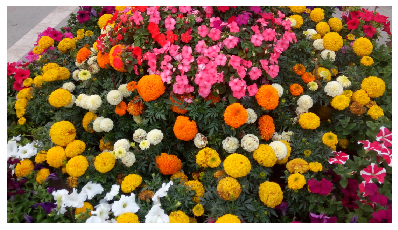

((-0.5, 1099.5, 618.5, -0.5), None)

In [10]:
im = Image.open('../images/flowers.png') # read image into an Image object with PIL
im = np.array(im) # create a numpy ndarray from the Image object
imshow(im) # use skimage imshow to display the image
plt.axis('off'), show()

In [11]:
im = imread('../images/flowers.png') # read image into numpy ndarray with skimage
im = Image.fromarray(im) # create a PIL Image object from the numpy ndarray
im.show() # display the image with PIL Image.show() method

[1.        0.8235294 0.7058824]


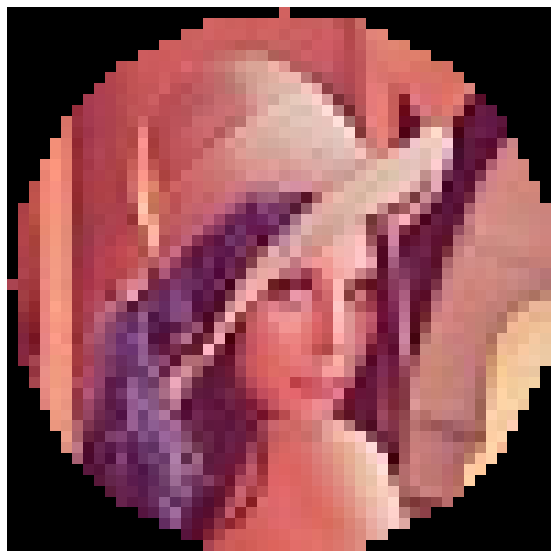

(<matplotlib.image.AxesImage at 0x7f182bc25210>,
 (-0.5, 49.5, 49.5, -0.5),
 None)

In [13]:
lena = mpimg.imread("../images/lena_small.jpg") # read the image from disk as a numpy ndarray
print(lena[0, 40])
# [180  76  83]
# print(lena[10:13, 20:23,0:1]) # slicing
lx, ly, _ = lena.shape
X, Y = np.ogrid[0:lx, 0:ly]
mask = (X - lx / 2) ** 2 + (Y - ly / 2) ** 2 > lx * ly / 4
lena[mask,:] = 0 # masks
plt.figure(figsize=(10,10))
plt.imshow(lena), plt.axis('off'), plt.show()

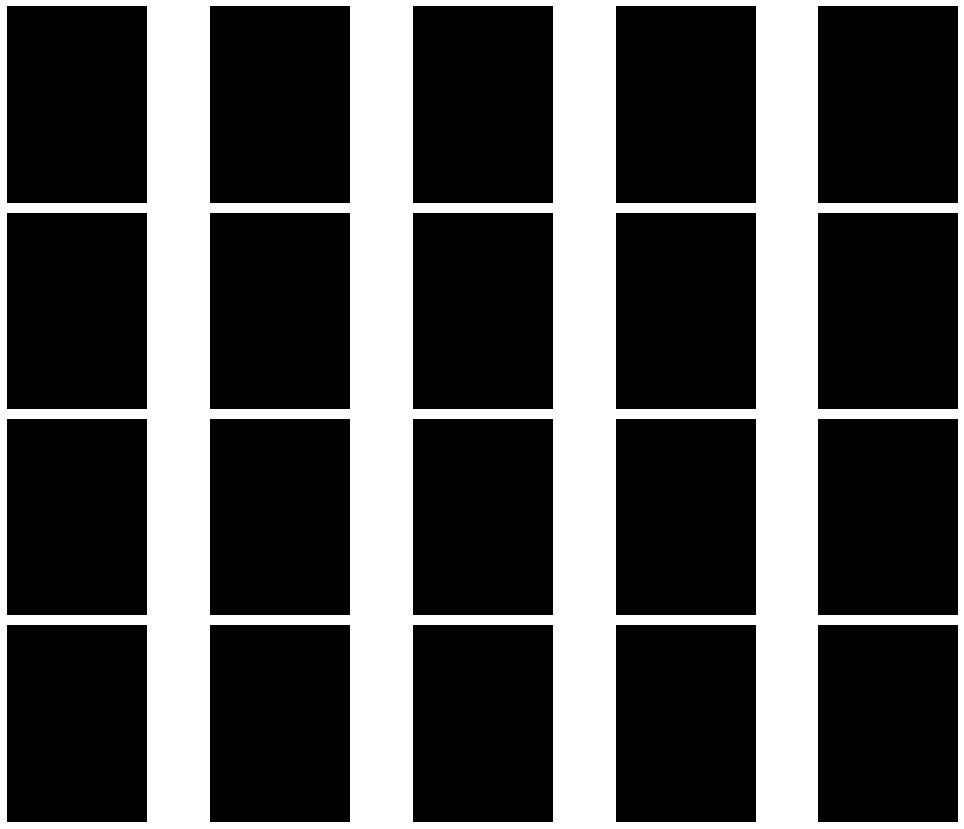

In [21]:
im1 = mpimg.imread("../images/messi.jpg") / 255 # scale RGB values in [0,1]
im2 = mpimg.imread("../images/ronaldo.jpg") / 255
i = 1
plt.figure(figsize=(18,15))
for alpha in np.linspace(0,1,20):
 plt.subplot(4,5,i)
 plt.imshow((1-alpha)*im1 + alpha*im2)
 plt.axis('off')
 i += 1
plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()

In [22]:
im = Image.open("../images/parrot.png")        # open the image, provide the correct path
print(im.width, im.height, im.mode, im.format) # print image size, mode and format
# 486 362 RGB PNG

453 340 RGB PNG


In [23]:
im_c = im.crop((175,75,320,200)) # crop the rectangle given by (left, top, right, bottom) from the image
im_c.show()

In [25]:
im = Image.open("../images/clock.png")
print(im.width, im.height)
# 107 105
im.show()

149 97


In [26]:
im_large = im.resize((im.width*5, im.height*5), Image.BILINEAR) # bi-linear interpolation

In [3]:
im = Image.open("../images/vic.png")
print(im.width, im.height)
# 720 540
im.show()

720 540


In [4]:
im_small = im.resize((im.width//5, im.height//5), Image.ANTIALIAS)

In [5]:
im = Image.open("../images/parrot.png") 
im_t = im.point(lambda x: 255 - x)
im_t.show()

In [6]:
im_g = im.convert('L')   # convert the RGB color image to a grayscale image

In [7]:
im_g.point(lambda x: 255*np.log(1+x/255)).show()

In [8]:
im.transpose(Image.FLIP_LEFT_RIGHT).show() # reflect about the vertical axis 

In [9]:
im_45 = im.rotate(45) # rotate the image by 45 degrees
im_45.show()          # show the rotated image

In [10]:
im = Image.open("../images/parrot.png")
im.transform((int(1.4*im.width), im.height), Image.AFFINE, data=(1,-0.5,0,0,1,0)).show() # shear

In [11]:
params = [1, 0.1, 0, -0.1, 0.5, 0, -0.005, -0.001]
im1 = im.transform((im.width//3, im.height), Image.PERSPECTIVE, params, Image.BICUBIC)
im1.show()

In [12]:
# choose 5000 random locations inside image
im1 = im.copy() # keep the original image, create a copy 
n = 5000
x, y = np.random.randint(0, im.width, n), np.random.randint(0, im.height, n)
for (x,y) in zip(x,y):
 im1.putpixel((x, y), ((0,0,0) if np.random.rand() < 0.5 else (255,255,255))) # salt-and-pepper noise
im1.show()

In [13]:
im = Image.open("../images/parrot.png")
draw = ImageDraw.Draw(im)
draw.ellipse((125, 125, 200, 250), fill=(255,255,255,128))
del draw
im.show()

In [14]:
draw = ImageDraw.Draw(im)
font = ImageFont.truetype("arial.ttf", 23) # use a truetype font
draw.text((10, 5), "Welcome to image processing with python", font=font)
del draw
im.show()

In [17]:
im_thumbnail = im.copy() # need to copy the original image first
im_thumbnail.thumbnail((100,100))
# now paste the thumbnail on the image 
im.paste(im_thumbnail,(10,10))
im.save("../images/parrot_thumb.jpg")
im.show()

In [18]:
s = stat.Stat(im)
print(s.extrema) # maximum and minimum pixel values for each channel R, G, B
# [(4, 255), (0, 255), (0, 253)]
print(s.count)
# [154020, 154020, 154020]
print(s.mean)
# [125.41305674587716, 124.43517724970783, 68.38463186599142]
print(s.median)
# [117, 128, 63]
print(s.stddev)
# [47.56564506512579, 51.08397900881395, 39.067418896260094]

[(4, 255), (0, 255), (0, 255)]
[154020, 154020, 154020]
[134.3405142189326, 137.12832748993637, 81.2557330216855]
[124, 138, 66]
[55.41577411693871, 57.088511629098555, 58.75506223235972]


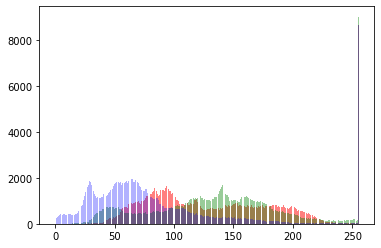

In [19]:
pl = im.histogram()
plt.bar(range(256), pl[:256], color='r', alpha=0.5)
plt.bar(range(256), pl[256:2*256], color='g', alpha=0.4)
plt.bar(range(256), pl[2*256:], color='b', alpha=0.3)
plt.show()

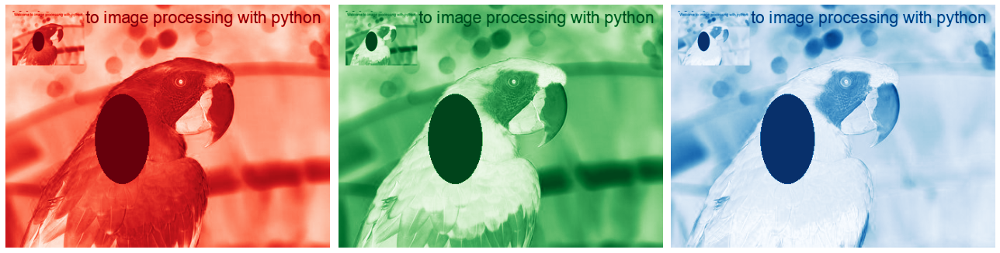

In [20]:
ch_r, ch_g, ch_b = im.split() # split the RGB image into 3 channels: R, G and B
# we shall use matplotlib to display the channels
plt.figure(figsize=(18,6))
plt.subplot(1,3,1); plt.imshow(ch_r, cmap=plt.cm.Reds); plt.axis('off')
plt.subplot(1,3,2); plt.imshow(ch_g, cmap=plt.cm.Greens); plt.axis('off')
plt.subplot(1,3,3); plt.imshow(ch_b, cmap=plt.cm.Blues); plt.axis('off')
plt.tight_layout()
plt.show() # show the R, G, B channels

In [21]:
im = Image.merge('RGB', (ch_b, ch_g, ch_r)) # swap the red and blue channels obtained last time with split()
im.show()

In [22]:
im1 = Image.open("../images/parrot.png")
im2 = Image.open("../images/hill.png")
# 453 340 1280 960 RGB RGBA
im1 = im1.convert('RGBA') # two images have different modes, must be converted to the same mode
im2 = im2.resize((im1.width, im1.height), Image.BILINEAR) # two images have different sizes, must be converted to the same size
im = Image.blend(im1, im2, alpha=0.5).show()

ValueError: images do not match

In [23]:
im1 = Image.open("../images/parrot.png")
im2 = Image.open("../images/hill.png").convert('RGB').resize((im1.width, im1.height))
multiply(im1, im2).show()

In [24]:
add(im1, im2).show()

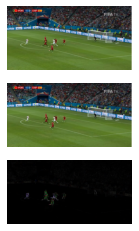

In [25]:
from PIL.ImageChops import subtract, multiply, screen, difference, add
im1 = Image.open("../images/goal1.png") # load two consecutive frame images from the video
im2 = Image.open("../images/goal2.png")
im = difference(im1, im2)
im.save("../images/goal_diff.png")

plt.subplot(311)
plt.imshow(im1)
plt.axis('off')
plt.subplot(312)
plt.imshow(im2)
plt.axis('off')
plt.subplot(313)
plt.imshow(im), plt.axis('off')
plt.show()

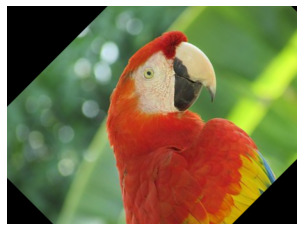

(<matplotlib.image.AxesImage at 0x7fa30a2b2690>,
 (-0.5, 452.5, 339.5, -0.5),
 None)

In [26]:
im = imread("../images/parrot.png")
tform = SimilarityTransform(scale=0.9, rotation=np.pi/4,translation=(im.shape[0]/2, -100))
warped = warp(im, tform)
import matplotlib.pyplot as plt
plt.imshow(warped), plt.axis('off'), plt.show()

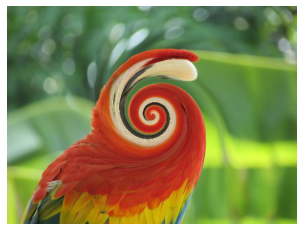

In [27]:
im = imread("../images/parrot.png")
swirled = swirl(im, rotation=0, strength=15, radius=200)
plt.imshow(swirled)
plt.axis('off')
plt.show()

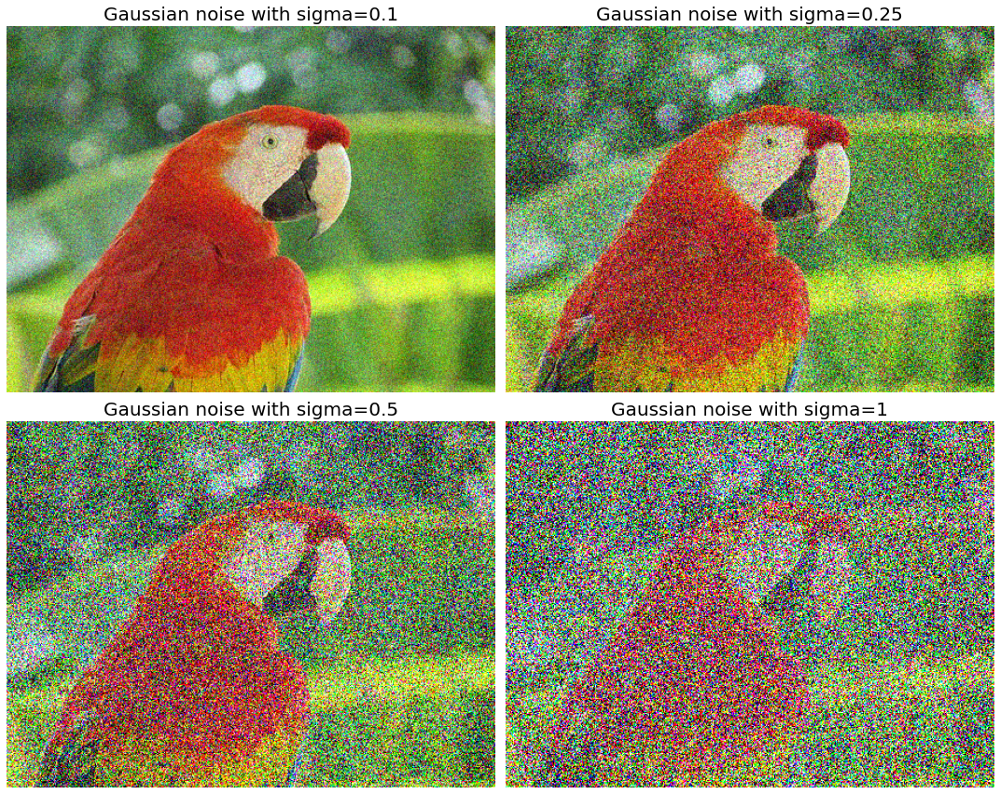

In [28]:
im = img_as_float(imread("../images/parrot.png"))
plt.figure(figsize=(15,12))
sigmas = [0.1, 0.25, 0.5, 1]
for i in range(4): 
 noisy = random_noise(im, var=sigmas[i]**2)
 plt.subplot(2,2,i+1)
 plt.imshow(noisy)
 plt.axis('off')
 plt.title('Gaussian noise with sigma=' + str(sigmas[i]), size=20)
plt.tight_layout()
plt.show()

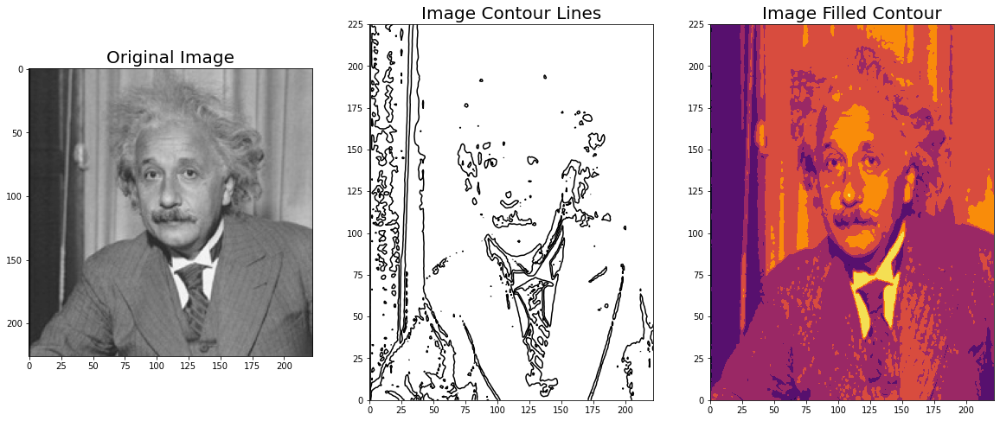

In [31]:
im = rgb2gray(imread("../images/einstein.jpg")) # read the image from disk as a numpy ndarray
plt.figure(figsize=(20,8))
plt.subplot(131), plt.imshow(im, cmap='gray'), plt.title('Original Image', size=20) 
plt.subplot(132), plt.contour(np.flipud(im), colors='k', levels=np.logspace(-15, 15, 100))
plt.title('Image Contour Lines', size=20)
plt.subplot(133), plt.title('Image Filled Contour', size=20), plt.contourf(np.flipud(im), cmap='inferno')
plt.show()